<a href="https://colab.research.google.com/github/atlantiquesun/Stock_ML/blob/main/stock_lstm_test_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# For all graphs, the blue line is the prediction and the orange line is the target

In [1]:
import os
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from matplotlib import pyplot as plt

# 1. Preprocessing

In [2]:
def make_multistep_dataset(df, features_column, steps=1):
  
  for i in range(steps):
    for feature in features_column:
      df[feature+"(t-"+str(i+1)+")"] = df[feature+"(t)"].shift(i+1)
  
  df = df.dropna()
  return df


def preprocess(df):

  #dropna
  df = df.dropna()
  #normalize
  #scaler = MinMaxScaler(feature_range=(0, 1))
  #df[df.columns] = scaler.fit_transform(df[df.columns])
  return df

def get_file_index(file_name):

    index = file_name.split(".")[0]
    start = 0
    while (start < len(index) and index[start] == "0"):
      start += 1
    return int(index[start:])


def load_single_stock_data(path, columns, steps):

  df = pd.read_csv(path, names=columns)
  df = preprocess(df)
  
  features_column = [x[:-3] for x in columns]
  df = make_multistep_dataset(df, features_column, steps)
  df = df.dropna()
  df['time_index'] = df.index
  df = df.reset_index(drop = True)

  return df



def load_data(data_folder, n_stocks, columns, steps):

  files = os.listdir(data_folder)
  files.sort(key = lambda x: get_file_index(x))

  df = None
  for i in range(n_stocks):
    
    # get file name
    file = files[i]

    # load data
    df_temp = pd.read_csv(data_folder+"/"+file, names=columns)

    # preprocess data
    df_temp = preprocess(df_temp)

    # make multistep dataset
    features_column = [x[:-3] for x in columns]
    df_temp = make_multistep_dataset(df_temp, features_column, steps)
    df_temp = df_temp.dropna()
    df_temp['time_index'] = df_temp.index #keep the original timestep index of each record

    #concatenate with df
    if (i==0):
      df = df_temp
    else:
      df = pd.concat([df, df_temp])

    # make sure the index is correct
    df = df.reset_index(drop = True)
  
  return df


In [18]:
def prepare_train_data(df, features_column, target_column, steps, start=0, train_window=72):
  '''
  'features_column' here is not necessarily the same as 'features_column' in make_multistep_dataset() and is a list
  'target_column' is a string, e.g. "open"
  '''

  df = df.loc[(df.time_index >= start) & (df.time_index < start+train_window)]

  train_columns = []
  for i in range(1, steps+1):
      train_columns.extend([x+"(t-"+str(i)+")" for x in features_column])
  
  #scale the data
  scaler = MinMaxScaler()
  array = df[df.columns].values
  array = scaler.fit_transform(array.T)
  array = array.T
  df[df.columns] = array

  X_train = df[train_columns].values
  X_train = np.sqrt(X_train) #nonlinear transform to prevent lagged prediction
  X_train_lstm = np.reshape(X_train, (X_train.shape[0], steps, len(features_column))) #lstm data shape: (samples, timesteps, features)
  y_train = df[target_column+"(t)"].values

  print(X_train.shape, X_train_lstm.shape, y_train.shape)
  return (X_train, X_train_lstm, y_train, scaler) #scaler is to be used on the test set


def prepare_test_data(df, features_column, target_column, steps, scaler, start=0, train_window=72):
  '''
  'features_column' here is not necessarily the same as 'features_column' in make_multistep_dataset() and is a list
  'target_column' is a string, e.g. "open"
  '''

  df = df.loc[(df.time_index >= start) & (df.time_index < start+train_window)]
  
  #scale the data along axis 0
  array = df[df.columns].values
  array = scaler.fit_transform(array.T)
  array = array.T
  df[df.columns] = array


  train_columns = []
  for i in range(1, steps+1):
      train_columns.extend([x+"(t-"+str(i)+")" for x in features_column])
  
  X_train = df[train_columns].values
  X_train = np.sqrt(X_train) #nonlinear transform to prevent lagged prediction
  X_train_lstm = np.reshape(X_train, (X_train.shape[0], steps, len(features_column))) #lstm data shape: (samples, timesteps, features)
  y_train = df[target_column+"(t)"].values

  print(X_train.shape, X_train_lstm.shape, y_train.shape)
  return (X_train, X_train_lstm, y_train)




def prepare_trade_data(df, features_column, target_column, steps, time_index):

  df = df.loc[df.time_index == time_index]

  columns = []
  for i in range(1, steps+1):
      columns.extend([x+"(t-"+str(i)+")" for x in features_column])
 
  X_trade = df[columns].values
  X_trade_lstm = np.reshape(X_trade, (X_trade.shape[0], steps, len(features_column)))
  y_trade = df[target_column+"(t)"].values

  print(X_trade.shape, X_trade_lstm.shape, y_trade.shape)
  return (X_trade, X_trade_lstm, y_trade)


# 2. LSTM Models

In [4]:
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.layers.recurrent import LSTM
from tensorflow.keras.optimizers import SGD

# models, two lstm models
def train_lstm1(X_train, y_train, epochs=50, batch_size=48):

  model = Sequential()
  model.add(LSTM(40, input_shape=(X_train.shape[1], X_train.shape[2])))
  model.add(Dense(1))
  model.compile(loss='mae', optimizer='adam')
  # fit network
  model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2, shuffle=False)

  return model


def train_lstm2(X_train, y_train, epochs=50, batch_size=64):

  model = Sequential()
  model.add(LSTM(20, input_shape=(X_train.shape[1], X_train.shape[2])))
  model.add(Dropout(0.5))
  model.add(Dense(20, activation="tanh"))
  model.add(Dense(1))

  model.compile(loss='mae', optimizer="adam")
  model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2, shuffle=False)

  return model


# 3. LSTM Training (multiple stocks)

In [8]:
# prepare data
columns = ["open(t)", "close(t)", "high(t)", "low(t)"]
steps = 20
data_folder = "/content/drive/MyDrive/StockML /processed_data"
n_stocks = 500 # use 500 stocks
df = load_data(data_folder, n_stocks, columns, steps)
display(df)

,open(t),close(t),high(t),low(t),open(t-1),close(t-1),high(t-1),low(t-1),open(t-2),close(t-2),high(t-2),low(t-2),open(t-3),close(t-3),high(t-3),low(t-3),open(t-4),close(t-4),high(t-4),low(t-4),open(t-5),close(t-5),high(t-5),low(t-5),open(t-6),close(t-6),high(t-6),low(t-6),open(t-7),close(t-7),high(t-7),low(t-7),open(t-8),close(t-8),high(t-8),low(t-8),open(t-9),close(t-9),high(t-9),low(t-9),...,close(t-11),high(t-11),low(t-11),open(t-12),close(t-12),high(t-12),low(t-12),open(t-13),close(t-13),high(t-13),low(t-13),open(t-14),close(t-14),high(t-14),low(t-14),open(t-15),close(t-15),high(t-15),low(t-15),open(t-16),close(t-16),high(t-16),low(t-16),open(t-17),close(t-17),high(t-17),low(t-17),open(t-18),close(t-18),high(t-18),low(t-18),open(t-19),close(t-19),high(t-19),low(t-19),open(t-20),close(t-20),high(t-20),low(t-20),time_index
0,21.37,21.28,21.51,21.01,21.43,21.21,21.79,21.04,22.23,21.92,22.38,21.51,22.10,21.99,22.11,21.39,22.21,21.76,22.50,21.65,23.61,22.21,23.61,22.09,23.77,23.66,24.00,23.39,23.81,24.11,24.36,23.30,24.41,23.63,24.77,23.20,24.60,24.39,24.65,23.98,...,24.74,25.11,24.08,23.99,24.41,25.04,23.85,23.30,24.76,24.98,23.20,23.20,23.10,23.91,22.73,22.82,24.36,24.80,22.52,22.63,22.91,23.36,22.53,22.60,22.63,23.00,22.27,22.14,22.90,23.29,22.14,22.13,22.20,23.14,22.13,21.55,22.31,22.42,21.26,20
1,21.45,21.48,21.98,21.09,21.37,21.28,21.51,21.01,21.43,21.21,21.79,21.04,22.23,21.92,22.38,21.51,22.10,21.99,22.11,21.39,22.21,21.76,22.50,21.65,23.61,22.21,23.61,22.09,23.77,23.66,24.00,23.39,23.81,24.11,24.36,23.30,24.41,23.63,24.77,23.20,...,24.61,24.71,23.91,24.41,24.74,25.11,24.08,23.99,24.41,25.04,23.85,23.30,24.76,24.98,23.20,23.20,23.10,23.91,22.73,22.82,24.36,24.80,22.52,22.63,22.91,23.36,22.53,22.60,22.63,23.00,22.27,22.14,22.90,23.29,22.14,22.13,22.20,23.14,22.13,21
2,21.41,22.83,22.90,21.29,21.45,21.48,21.98,21.09,21.37,21.28,21.51,21.01,21.43,21.21,21.79,21.04,22.23,21.92,22.38,21.51,22.10,21.99,22.11,21.39,22.21,21.76,22.50,21.65,23.61,22.21,23.61,22.09,23.77,23.66,24.00,23.39,23.81,24.11,24.36,23.30,...,24.39,24.65,23.98,24.71,24.61,24.71,23.91,24.41,24.74,25.11,24.08,23.99,24.41,25.04,23.85,23.30,24.76,24.98,23.20,23.20,23.10,23.91,22.73,22.82,24.36,24.80,22.52,22.63,22.91,23.36,22.53,22.60,22.63,23.00,22.27,22.14,22.90,23.29,22.14,22
3,22.59,22.74,23.31,22.47,21.41,22.83,22.90,21.29,21.45,21.48,21.98,21.09,21.37,21.28,21.51,21.01,21.43,21.21,21.79,21.04,22.23,21.92,22.38,21.51,22.10,21.99,22.11,21.39,22.21,21.76,22.50,21.65,23.61,22.21,23.61,22.09,23.77,23.66,24.00,23.39,...,23.63,24.77,23.20,24.60,24.39,24.65,23.98,24.71,24.61,24.71,23.91,24.41,24.74,25.11,24.08,23.99,24.41,25.04,23.85,23.30,24.76,24.98,23.20,23.20,23.10,23.91,22.73,22.82,24.36,24.80,22.52,22.63,22.91,23.36,22.53,22.60,22.63,23.00,22.27,23
4,22.52,22.17,22.80,21.69,22.59,22.74,23.31,22.47,21.41,22.83,22.90,21.29,21.45,21.48,21.98,21.09,21.37,21.28,21.51,21.01,21.43,21.21,21.79,21.04,22.23,21.92,22.38,21.51,22.10,21.99,22.11,21.39,22.21,21.76,22.50,21.65,23.61,22.21,23.61,22.09,...,24.11,24.36,23.30,24.41,23.63,24.77,23.20,24.60,24.39,24.65,23.98,24.71,24.61,24.71,23.91,24.41,24.74,25.11,24.08,23.99,24.41,25.04,23.85,23.30,24.76,24.98,23.20,23.20,23.10,23.91,22.73,22.82,24.36,24.80,22.52,22.63,22.91,23.36,22.53,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54995,423.24,402.60,429.64,389.65,389.88,432.00,432.00,386.08,379.95,393.96,400.01,365.50,364.00,372.88,374.16,337.03,371.99,373.00,405.02,362.00,369.47,368.55,380.74,353.01,375.00,373.38,384.66,367.38,350.00,375.18,380.88,335.50,322.32,346.25,346.25,318.65,318.15,314.77,326.33,308.18,...,324.21,351.00,320.00,313.00,332.00,335.00,310.74,319.89,316.63,328.88,314.00,330.00,323.33,333.91,310.00,328.00,334.64,344.20,314.

In [22]:
# training set up 
features_column = ["open", "close", "high", "low"]
target_column = "close"
steps = 20 #use 20 timesteps for each training sample
train_start = steps
train_window = 72
test_start = train_start + train_window
test_window = 32
epochs = 40

# prepare datasets
X_train, X_train_lstm, y_train, scaler = prepare_train_data(df, features_column, target_column, steps, train_start, train_window)
X_test, X_test_lstm, y_test = prepare_test_data(df, features_column, target_column, steps, scaler, test_start, test_window)

# train and predict
#model_1 = train_lstm1(X_train_lstm, y_train, epochs)
#y_pred_1 = model_1.predict(X_test_lstm)
#y_pred_1 = np.reshape(y_pred_1, (-1, test_window)) #reshape into (n_stocks, test_window)
model_2 = train_lstm2(X_train_lstm, y_train, epochs)
y_pred_2 = model_2.predict(X_test_lstm)
y_pred_2 = np.reshape(y_pred_2, (-1, test_window)) #reshape into (n_stocks, test_window)
y_test = np.reshape(y_test, (-1, test_window))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(36000, 80) (36000, 20, 4) (36000,)
(16000, 80) (16000, 20, 4) (16000,)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


Epoch 1/40
750/750 - 7s - loss: 0.0480
Epoch 2/40
750/750 - 6s - loss: 0.0376
Epoch 3/40
750/750 - 6s - loss: 0.0316
Epoch 4/40
750/750 - 6s - loss: 0.0298
Epoch 5/40
750/750 - 6s - loss: 0.0281
Epoch 6/40
750/750 - 6s - loss: 0.0252
Epoch 7/40
750/750 - 6s - loss: 0.0232
Epoch 8/40
750/750 - 6s - loss: 0.0226
Epoch 9/40
750/750 - 6s - loss: 0.0219
Epoch 10/40
750/750 - 6s - loss: 0.0210
Epoch 11/40
750/750 - 6s - loss: 0.0207
Epoch 12/40
750/750 - 6s - loss: 0.0198
Epoch 13/40
750/750 - 6s - loss: 0.0200
Epoch 14/40
750/750 - 6s - loss: 0.0189
Epoch 15/40
750/750 - 6s - loss: 0.0193
Epoch 16/40
750/750 - 6s - loss: 0.0192
Epoch 17/40
750/750 - 6s - loss: 0.0185
Epoch 18/40
750/750 - 6s - loss: 0.0195
Epoch 19/40
750/750 - 6s - loss: 0.0182
Epoch 20/40
750/750 - 6s - loss: 0.0182
Epoch 21/40
750/750 - 6s - loss: 0.0187
Epoch 22/40
750/750 - 6s - loss: 0.0174
Epoch 23/40
750/750 - 6s - loss: 0.0184
Epoch 24/40
750/750 - 6s - loss: 0.0177
Epoch 25/40
750/750 - 6s - loss: 0.0182
Epoch 26/

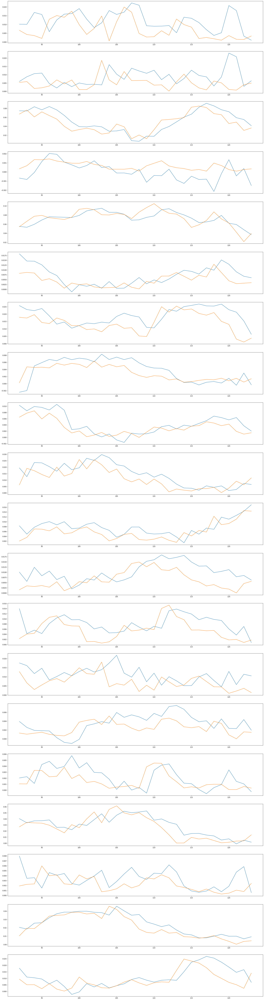

In [24]:
y_pred_2 = model_2.predict(X_test_lstm)
y_pred_2 = np.reshape(y_pred_2, (-1, test_window)) #reshape into (n_stocks, test_window)
y_test = np.reshape(y_test, (-1, test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 10 stocks
  axs[i].plot(x, y_pred_2[i], label="prediction")
  axs[i].plot(x, y_test[i], label="actual")


# 4. LSTM Model Training (Multiple Stocks Rolling Window)

In [ ]:
# prepare data
columns = ["open(t)", "close(t)", "high(t)", "low(t)"]
steps = 20
data_folder = "/content/drive/MyDrive/StockML /processed_data"
n_stocks = 500 # use 500 stocks
df = load_data(data_folder, n_stocks, columns, steps)
display(df)

In [29]:
# training set up 
features_column = ["open", "close", "high", "low"]
target_column = "close"
steps = 20 #use 20 timesteps for each training sample
n_windows = 15
train_starts = list(range(steps, steps+n_windows))
train_window = 48
test_starts = list(range(train_start+train_window, train_start+train_window+n_windows))
test_window = 1
epochs = 40
prediction = None
actual = None

for i in range(n_windows):

  train_start = train_starts[i]
  test_start = test_starts[i]
  # prepare datasets
  X_train, X_train_lstm, y_train, scaler = prepare_train_data(df, features_column, target_column, steps, train_start, train_window)
  X_test, X_test_lstm, y_test = prepare_test_data(df, features_column, target_column, steps, scaler, test_start, test_window)

  # train and predict
  #model_1 = train_lstm1(X_train_lstm, y_train, epochs)
  #y_pred_1 = model_1.predict(X_test_lstm)
  #y_pred_1 = np.reshape(y_pred_1, (-1, test_window)) #reshape into (n_stocks, test_window)
  model_2 = train_lstm2(X_train_lstm, y_train, epochs)
  y_pred_2 = model_2.predict(X_test_lstm)
  y_pred_2 = np.reshape(y_pred_2, (-1, test_window)) #reshape into (n_stocks, test_window)
  y_test = np.reshape(y_test, (-1, test_window))
  
  if (prediction is None):
    prediction = y_pred_2
  else:
    prediction = np.concatenate((prediction, y_pred_2), axis=1)
  
  if (actual is None):
    actual = y_test
  else:
    actual = np.concatenate((actual, y_test), axis=1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0530
Epoch 2/40
500/500 - 4s - loss: 0.0416
Epoch 3/40
500/500 - 4s - loss: 0.0370
Epoch 4/40
500/500 - 4s - loss: 0.0357
Epoch 5/40
500/500 - 4s - loss: 0.0341
Epoch 6/40
500/500 - 4s - loss: 0.0330
Epoch 7/40
500/500 - 4s - loss: 0.0319
Epoch 8/40
500/500 - 4s - loss: 0.0309
Epoch 9/40
500/500 - 4s - loss: 0.0303
Epoch 10/40
500/500 - 4s - loss: 0.0295
Epoch 11/40
500/500 - 4s - loss: 0.0280
Epoch 12/40
500/500 - 4s - loss: 0.0272
Epoch 13/40
500/500 - 4s - loss: 0.0258
Epoch 14/40
500/500 - 4s - loss: 0.0256
Epoch 15/40
500/500 - 4s - loss: 0.0250
Epoch 16/40
500/500 - 4s - loss: 0.0246
Epoch 17/40
500/500 - 4s - loss: 0.0236
Epoch 18/40
500/500 - 4s - loss: 0.0236
Epoch 19/40
500/500 - 4s - loss: 0.0236
Epoch 20/40
500/500 - 4s - loss: 0.0234
Epoch 21/40
500/500 - 4s - loss: 0.0231
Epoch 22/40
500/500 - 4s - loss: 0.0230
Epoch 23/40
500/500 - 4s - loss: 0.0218
Epoch 24/40
500/500 - 4s - loss: 0.0227
Epoch 25/40
500/500 - 4s - loss: 0.0222
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 28s - loss: 0.0546
Epoch 2/40
500/500 - 4s - loss: 0.0438
Epoch 3/40
500/500 - 4s - loss: 0.0386
Epoch 4/40
500/500 - 4s - loss: 0.0352
Epoch 5/40
500/500 - 4s - loss: 0.0335
Epoch 6/40
500/500 - 4s - loss: 0.0321
Epoch 7/40
500/500 - 4s - loss: 0.0294
Epoch 8/40
500/500 - 4s - loss: 0.0291
Epoch 9/40
500/500 - 4s - loss: 0.0298
Epoch 10/40
500/500 - 4s - loss: 0.0268
Epoch 11/40
500/500 - 4s - loss: 0.0257
Epoch 12/40
500/500 - 4s - loss: 0.0252
Epoch 13/40
500/500 - 4s - loss: 0.0244
Epoch 14/40
500/500 - 4s - loss: 0.0239
Epoch 15/40
500/500 - 4s - loss: 0.0233
Epoch 16/40
500/500 - 4s - loss: 0.0232
Epoch 17/40
500/500 - 4s - loss: 0.0229
Epoch 18/40
500/500 - 4s - loss: 0.0227
Epoch 19/40
500/500 - 4s - loss: 0.0225
Epoch 20/40
500/500 - 4s - loss: 0.0227
Epoch 21/40
500/500 - 4s - loss: 0.0226
Epoch 22/40
500/500 - 4s - loss: 0.0218
Epoch 23/40
500/500 - 4s - loss: 0.0216
Epoch 24/40
500/500 - 4s - loss: 0.0210
Epoch 25/40
500/500 - 4s - loss: 0.0222
Epoch 26/40
500/500

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0536
Epoch 2/40
500/500 - 4s - loss: 0.0417
Epoch 3/40
500/500 - 4s - loss: 0.0397
Epoch 4/40
500/500 - 4s - loss: 0.0367
Epoch 5/40
500/500 - 4s - loss: 0.0359
Epoch 6/40
500/500 - 4s - loss: 0.0349
Epoch 7/40
500/500 - 4s - loss: 0.0336
Epoch 8/40
500/500 - 4s - loss: 0.0334
Epoch 9/40
500/500 - 4s - loss: 0.0356
Epoch 10/40
500/500 - 4s - loss: 0.0290
Epoch 11/40
500/500 - 4s - loss: 0.0286
Epoch 12/40
500/500 - 4s - loss: 0.0281
Epoch 13/40
500/500 - 4s - loss: 0.0268
Epoch 14/40
500/500 - 4s - loss: 0.0258
Epoch 15/40
500/500 - 4s - loss: 0.0250
Epoch 16/40
500/500 - 4s - loss: 0.0247
Epoch 17/40
500/500 - 4s - loss: 0.0239
Epoch 18/40
500/500 - 4s - loss: 0.0234
Epoch 19/40
500/500 - 4s - loss: 0.0234
Epoch 20/40
500/500 - 4s - loss: 0.0227
Epoch 21/40
500/500 - 4s - loss: 0.0225
Epoch 22/40
500/500 - 4s - loss: 0.0220
Epoch 23/40
500/500 - 4s - loss: 0.0225
Epoch 24/40
500/500 - 4s - loss: 0.0222
Epoch 25/40
500/500 - 4s - loss: 0.0216
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0479
Epoch 2/40
500/500 - 4s - loss: 0.0377
Epoch 3/40
500/500 - 4s - loss: 0.0349
Epoch 4/40
500/500 - 4s - loss: 0.0331
Epoch 5/40
500/500 - 4s - loss: 0.0320
Epoch 6/40
500/500 - 4s - loss: 0.0309
Epoch 7/40
500/500 - 4s - loss: 0.0308
Epoch 8/40
500/500 - 4s - loss: 0.0296
Epoch 9/40
500/500 - 4s - loss: 0.0283
Epoch 10/40
500/500 - 4s - loss: 0.0278
Epoch 11/40
500/500 - 4s - loss: 0.0272
Epoch 12/40
500/500 - 4s - loss: 0.0260
Epoch 13/40
500/500 - 4s - loss: 0.0249
Epoch 14/40
500/500 - 4s - loss: 0.0241
Epoch 15/40
500/500 - 4s - loss: 0.0232
Epoch 16/40
500/500 - 4s - loss: 0.0226
Epoch 17/40
500/500 - 4s - loss: 0.0228
Epoch 18/40
500/500 - 4s - loss: 0.0223
Epoch 19/40
500/500 - 4s - loss: 0.0217
Epoch 20/40
500/500 - 4s - loss: 0.0220
Epoch 21/40
500/500 - 4s - loss: 0.0212
Epoch 22/40
500/500 - 4s - loss: 0.0211
Epoch 23/40
500/500 - 4s - loss: 0.0210
Epoch 24/40
500/500 - 4s - loss: 0.0211
Epoch 25/40
500/500 - 4s - loss: 0.0210
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0484
Epoch 2/40
500/500 - 4s - loss: 0.0396
Epoch 3/40
500/500 - 4s - loss: 0.0360
Epoch 4/40
500/500 - 4s - loss: 0.0347
Epoch 5/40
500/500 - 4s - loss: 0.0329
Epoch 6/40
500/500 - 4s - loss: 0.0314
Epoch 7/40
500/500 - 4s - loss: 0.0298
Epoch 8/40
500/500 - 4s - loss: 0.0305
Epoch 9/40
500/500 - 4s - loss: 0.0290
Epoch 10/40
500/500 - 4s - loss: 0.0271
Epoch 11/40
500/500 - 4s - loss: 0.0269
Epoch 12/40
500/500 - 4s - loss: 0.0282
Epoch 13/40
500/500 - 4s - loss: 0.0249
Epoch 14/40
500/500 - 4s - loss: 0.0250
Epoch 15/40
500/500 - 4s - loss: 0.0233
Epoch 16/40
500/500 - 4s - loss: 0.0239
Epoch 17/40
500/500 - 4s - loss: 0.0220
Epoch 18/40
500/500 - 4s - loss: 0.0234
Epoch 19/40
500/500 - 4s - loss: 0.0215
Epoch 20/40
500/500 - 4s - loss: 0.0216
Epoch 21/40
500/500 - 4s - loss: 0.0212
Epoch 22/40
500/500 - 4s - loss: 0.0209
Epoch 23/40
500/500 - 4s - loss: 0.0206
Epoch 24/40
500/500 - 4s - loss: 0.0207
Epoch 25/40
500/500 - 4s - loss: 0.0208
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0508
Epoch 2/40
500/500 - 4s - loss: 0.0379
Epoch 3/40
500/500 - 4s - loss: 0.0331
Epoch 4/40
500/500 - 4s - loss: 0.0311
Epoch 5/40
500/500 - 4s - loss: 0.0305
Epoch 6/40
500/500 - 4s - loss: 0.0304
Epoch 7/40
500/500 - 4s - loss: 0.0290
Epoch 8/40
500/500 - 4s - loss: 0.0290
Epoch 9/40
500/500 - 4s - loss: 0.0274
Epoch 10/40
500/500 - 4s - loss: 0.0270
Epoch 11/40
500/500 - 4s - loss: 0.0272
Epoch 12/40
500/500 - 4s - loss: 0.0251
Epoch 13/40
500/500 - 4s - loss: 0.0246
Epoch 14/40
500/500 - 4s - loss: 0.0237
Epoch 15/40
500/500 - 4s - loss: 0.0227
Epoch 16/40
500/500 - 4s - loss: 0.0234
Epoch 17/40
500/500 - 4s - loss: 0.0233
Epoch 18/40
500/500 - 4s - loss: 0.0221
Epoch 19/40
500/500 - 4s - loss: 0.0218
Epoch 20/40
500/500 - 4s - loss: 0.0219
Epoch 21/40
500/500 - 4s - loss: 0.0208
Epoch 22/40
500/500 - 4s - loss: 0.0205
Epoch 23/40
500/500 - 4s - loss: 0.0201
Epoch 24/40
500/500 - 4s - loss: 0.0201
Epoch 25/40
500/500 - 4s - loss: 0.0200
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0470
Epoch 2/40
500/500 - 4s - loss: 0.0364
Epoch 3/40
500/500 - 4s - loss: 0.0345
Epoch 4/40
500/500 - 4s - loss: 0.0314
Epoch 5/40
500/500 - 4s - loss: 0.0296
Epoch 6/40
500/500 - 4s - loss: 0.0289
Epoch 7/40
500/500 - 4s - loss: 0.0267
Epoch 8/40
500/500 - 4s - loss: 0.0259
Epoch 9/40
500/500 - 4s - loss: 0.0253
Epoch 10/40
500/500 - 4s - loss: 0.0240
Epoch 11/40
500/500 - 4s - loss: 0.0233
Epoch 12/40
500/500 - 4s - loss: 0.0228
Epoch 13/40
500/500 - 4s - loss: 0.0226
Epoch 14/40
500/500 - 4s - loss: 0.0220
Epoch 15/40
500/500 - 4s - loss: 0.0214
Epoch 16/40
500/500 - 4s - loss: 0.0224
Epoch 17/40
500/500 - 4s - loss: 0.0215
Epoch 18/40
500/500 - 4s - loss: 0.0212
Epoch 19/40
500/500 - 4s - loss: 0.0202
Epoch 20/40
500/500 - 4s - loss: 0.0209
Epoch 21/40
500/500 - 4s - loss: 0.0202
Epoch 22/40
500/500 - 4s - loss: 0.0200
Epoch 23/40
500/500 - 4s - loss: 0.0194
Epoch 24/40
500/500 - 4s - loss: 0.0198
Epoch 25/40
500/500 - 4s - loss: 0.0191
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0493
Epoch 2/40
500/500 - 4s - loss: 0.0359
Epoch 3/40
500/500 - 4s - loss: 0.0324
Epoch 4/40
500/500 - 4s - loss: 0.0304
Epoch 5/40
500/500 - 4s - loss: 0.0292
Epoch 6/40
500/500 - 4s - loss: 0.0288
Epoch 7/40
500/500 - 4s - loss: 0.0274
Epoch 8/40
500/500 - 4s - loss: 0.0258
Epoch 9/40
500/500 - 4s - loss: 0.0256
Epoch 10/40
500/500 - 4s - loss: 0.0238
Epoch 11/40
500/500 - 4s - loss: 0.0233
Epoch 12/40
500/500 - 4s - loss: 0.0243
Epoch 13/40
500/500 - 4s - loss: 0.0223
Epoch 14/40
500/500 - 4s - loss: 0.0216
Epoch 15/40
500/500 - 4s - loss: 0.0216
Epoch 16/40
500/500 - 4s - loss: 0.0219
Epoch 17/40
500/500 - 4s - loss: 0.0207
Epoch 18/40
500/500 - 4s - loss: 0.0198
Epoch 19/40
500/500 - 4s - loss: 0.0198
Epoch 20/40
500/500 - 4s - loss: 0.0197
Epoch 21/40
500/500 - 4s - loss: 0.0189
Epoch 22/40
500/500 - 4s - loss: 0.0196
Epoch 23/40
500/500 - 4s - loss: 0.0191
Epoch 24/40
500/500 - 4s - loss: 0.0185
Epoch 25/40
500/500 - 4s - loss: 0.0188
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0438
Epoch 2/40
500/500 - 4s - loss: 0.0336
Epoch 3/40
500/500 - 4s - loss: 0.0296
Epoch 4/40
500/500 - 4s - loss: 0.0286
Epoch 5/40
500/500 - 4s - loss: 0.0280
Epoch 6/40
500/500 - 4s - loss: 0.0268
Epoch 7/40
500/500 - 4s - loss: 0.0263
Epoch 8/40
500/500 - 4s - loss: 0.0250
Epoch 9/40
500/500 - 4s - loss: 0.0245
Epoch 10/40
500/500 - 4s - loss: 0.0238
Epoch 11/40
500/500 - 4s - loss: 0.0226
Epoch 12/40
500/500 - 4s - loss: 0.0218
Epoch 13/40
500/500 - 4s - loss: 0.0206
Epoch 14/40
500/500 - 4s - loss: 0.0207
Epoch 15/40
500/500 - 4s - loss: 0.0208
Epoch 16/40
500/500 - 4s - loss: 0.0199
Epoch 17/40
500/500 - 4s - loss: 0.0196
Epoch 18/40
500/500 - 4s - loss: 0.0188
Epoch 19/40
500/500 - 4s - loss: 0.0189
Epoch 20/40
500/500 - 4s - loss: 0.0187
Epoch 21/40
500/500 - 4s - loss: 0.0185
Epoch 22/40
500/500 - 4s - loss: 0.0187
Epoch 23/40
500/500 - 4s - loss: 0.0190
Epoch 24/40
500/500 - 4s - loss: 0.0181
Epoch 25/40
500/500 - 4s - loss: 0.0179
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0467
Epoch 2/40
500/500 - 4s - loss: 0.0317
Epoch 3/40
500/500 - 4s - loss: 0.0277
Epoch 4/40
500/500 - 4s - loss: 0.0273
Epoch 5/40
500/500 - 4s - loss: 0.0253
Epoch 6/40
500/500 - 4s - loss: 0.0241
Epoch 7/40
500/500 - 4s - loss: 0.0241
Epoch 8/40
500/500 - 4s - loss: 0.0228
Epoch 9/40
500/500 - 4s - loss: 0.0223
Epoch 10/40
500/500 - 4s - loss: 0.0215
Epoch 11/40
500/500 - 4s - loss: 0.0212
Epoch 12/40
500/500 - 4s - loss: 0.0216
Epoch 13/40
500/500 - 4s - loss: 0.0199
Epoch 14/40
500/500 - 4s - loss: 0.0191
Epoch 15/40
500/500 - 4s - loss: 0.0201
Epoch 16/40
500/500 - 4s - loss: 0.0184
Epoch 17/40
500/500 - 4s - loss: 0.0192
Epoch 18/40
500/500 - 4s - loss: 0.0181
Epoch 19/40
500/500 - 4s - loss: 0.0205
Epoch 20/40
500/500 - 4s - loss: 0.0186
Epoch 21/40
500/500 - 4s - loss: 0.0172
Epoch 22/40
500/500 - 4s - loss: 0.0191
Epoch 23/40
500/500 - 4s - loss: 0.0180
Epoch 24/40
500/500 - 4s - loss: 0.0168
Epoch 25/40
500/500 - 4s - loss: 0.0179
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0451
Epoch 2/40
500/500 - 4s - loss: 0.0326
Epoch 3/40
500/500 - 4s - loss: 0.0307
Epoch 4/40
500/500 - 4s - loss: 0.0283
Epoch 5/40
500/500 - 4s - loss: 0.0280
Epoch 6/40
500/500 - 4s - loss: 0.0263
Epoch 7/40
500/500 - 4s - loss: 0.0245
Epoch 8/40
500/500 - 4s - loss: 0.0234
Epoch 9/40
500/500 - 4s - loss: 0.0215
Epoch 10/40
500/500 - 4s - loss: 0.0202
Epoch 11/40
500/500 - 4s - loss: 0.0201
Epoch 12/40
500/500 - 4s - loss: 0.0196
Epoch 13/40
500/500 - 4s - loss: 0.0184
Epoch 14/40
500/500 - 4s - loss: 0.0191
Epoch 15/40
500/500 - 4s - loss: 0.0200
Epoch 16/40
500/500 - 4s - loss: 0.0197
Epoch 17/40
500/500 - 4s - loss: 0.0190
Epoch 18/40
500/500 - 4s - loss: 0.0183
Epoch 19/40
500/500 - 4s - loss: 0.0178
Epoch 20/40
500/500 - 4s - loss: 0.0190
Epoch 21/40
500/500 - 4s - loss: 0.0172
Epoch 22/40
500/500 - 4s - loss: 0.0175
Epoch 23/40
500/500 - 4s - loss: 0.0181
Epoch 24/40
500/500 - 4s - loss: 0.0182
Epoch 25/40
500/500 - 4s - loss: 0.0170
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0452
Epoch 2/40
500/500 - 4s - loss: 0.0294
Epoch 3/40
500/500 - 4s - loss: 0.0265
Epoch 4/40
500/500 - 4s - loss: 0.0261
Epoch 5/40
500/500 - 4s - loss: 0.0242
Epoch 6/40
500/500 - 4s - loss: 0.0226
Epoch 7/40
500/500 - 4s - loss: 0.0220
Epoch 8/40
500/500 - 4s - loss: 0.0205
Epoch 9/40
500/500 - 4s - loss: 0.0210
Epoch 10/40
500/500 - 4s - loss: 0.0188
Epoch 11/40
500/500 - 4s - loss: 0.0198
Epoch 12/40
500/500 - 4s - loss: 0.0185
Epoch 13/40
500/500 - 4s - loss: 0.0185
Epoch 14/40
500/500 - 4s - loss: 0.0180
Epoch 15/40
500/500 - 4s - loss: 0.0182
Epoch 16/40
500/500 - 4s - loss: 0.0185
Epoch 17/40
500/500 - 4s - loss: 0.0179
Epoch 18/40
500/500 - 4s - loss: 0.0182
Epoch 19/40
500/500 - 4s - loss: 0.0172
Epoch 20/40
500/500 - 4s - loss: 0.0168
Epoch 21/40
500/500 - 4s - loss: 0.0171
Epoch 22/40
500/500 - 4s - loss: 0.0167
Epoch 23/40
500/500 - 4s - loss: 0.0166
Epoch 24/40
500/500 - 4s - loss: 0.0168
Epoch 25/40
500/500 - 4s - loss: 0.0163
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0426
Epoch 2/40
500/500 - 4s - loss: 0.0309
Epoch 3/40
500/500 - 4s - loss: 0.0282
Epoch 4/40
500/500 - 4s - loss: 0.0273
Epoch 5/40
500/500 - 4s - loss: 0.0261
Epoch 6/40
500/500 - 4s - loss: 0.0260
Epoch 7/40
500/500 - 4s - loss: 0.0242
Epoch 8/40
500/500 - 4s - loss: 0.0246
Epoch 9/40
500/500 - 4s - loss: 0.0243
Epoch 10/40
500/500 - 4s - loss: 0.0225
Epoch 11/40
500/500 - 4s - loss: 0.0219
Epoch 12/40
500/500 - 4s - loss: 0.0212
Epoch 13/40
500/500 - 4s - loss: 0.0207
Epoch 14/40
500/500 - 4s - loss: 0.0215
Epoch 15/40
500/500 - 4s - loss: 0.0202
Epoch 16/40
500/500 - 4s - loss: 0.0192
Epoch 17/40
500/500 - 4s - loss: 0.0187
Epoch 18/40
500/500 - 4s - loss: 0.0200
Epoch 19/40
500/500 - 4s - loss: 0.0186
Epoch 20/40
500/500 - 4s - loss: 0.0190
Epoch 21/40
500/500 - 4s - loss: 0.0172
Epoch 22/40
500/500 - 4s - loss: 0.0171
Epoch 23/40
500/500 - 4s - loss: 0.0188
Epoch 24/40
500/500 - 4s - loss: 0.0180
Epoch 25/40
500/500 - 4s - loss: 0.0178
Epoch 26/40
500/500 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


Epoch 1/40
500/500 - 5s - loss: 0.0408
Epoch 2/40
500/500 - 4s - loss: 0.0297
Epoch 3/40
500/500 - 4s - loss: 0.0273
Epoch 4/40
500/500 - 4s - loss: 0.0263
Epoch 5/40
500/500 - 4s - loss: 0.0237
Epoch 6/40
500/500 - 4s - loss: 0.0233
Epoch 7/40
500/500 - 4s - loss: 0.0229
Epoch 8/40
500/500 - 4s - loss: 0.0227
Epoch 9/40
500/500 - 4s - loss: 0.0227
Epoch 10/40
500/500 - 4s - loss: 0.0217
Epoch 11/40
500/500 - 4s - loss: 0.0204
Epoch 12/40
500/500 - 4s - loss: 0.0202
Epoch 13/40
500/500 - 4s - loss: 0.0198
Epoch 14/40
500/500 - 4s - loss: 0.0203
Epoch 15/40
500/500 - 4s - loss: 0.0194
Epoch 16/40
500/500 - 4s - loss: 0.0187
Epoch 17/40
500/500 - 4s - loss: 0.0182
Epoch 18/40
500/500 - 4s - loss: 0.0199
Epoch 19/40
500/500 - 4s - loss: 0.0176
Epoch 20/40
500/500 - 4s - loss: 0.0180
Epoch 21/40
500/500 - 4s - loss: 0.0176
Epoch 22/40
500/500 - 4s - loss: 0.0175
Epoch 23/40
500/500 - 4s - loss: 0.0169
Epoch 24/40
500/500 - 4s - loss: 0.0172
Epoch 25/40
500/500 - 4s - loss: 0.0170
Epoch 26/

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(24000, 80) (24000, 20, 4) (24000,)
(500, 80) (500, 20, 4) (500,)
Epoch 1/40


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


500/500 - 5s - loss: 0.0419
Epoch 2/40
500/500 - 4s - loss: 0.0289
Epoch 3/40
500/500 - 4s - loss: 0.0268
Epoch 4/40
500/500 - 4s - loss: 0.0259
Epoch 5/40
500/500 - 4s - loss: 0.0245
Epoch 6/40
500/500 - 4s - loss: 0.0234
Epoch 7/40
500/500 - 4s - loss: 0.0219
Epoch 8/40
500/500 - 4s - loss: 0.0230
Epoch 9/40
500/500 - 4s - loss: 0.0222
Epoch 10/40
500/500 - 4s - loss: 0.0200
Epoch 11/40
500/500 - 4s - loss: 0.0217
Epoch 12/40
500/500 - 4s - loss: 0.0190
Epoch 13/40
500/500 - 4s - loss: 0.0214
Epoch 14/40
500/500 - 4s - loss: 0.0177
Epoch 15/40
500/500 - 4s - loss: 0.0199
Epoch 16/40
500/500 - 4s - loss: 0.0182
Epoch 17/40
500/500 - 4s - loss: 0.0180
Epoch 18/40
500/500 - 4s - loss: 0.0171
Epoch 19/40
500/500 - 4s - loss: 0.0168
Epoch 20/40
500/500 - 4s - loss: 0.0185
Epoch 21/40
500/500 - 4s - loss: 0.0165
Epoch 22/40
500/500 - 4s - loss: 0.0161
Epoch 23/40
500/500 - 4s - loss: 0.0166
Epoch 24/40
500/500 - 4s - loss: 0.0162
Epoch 25/40
500/500 - 4s - loss: 0.0165
Epoch 26/40
500/500 

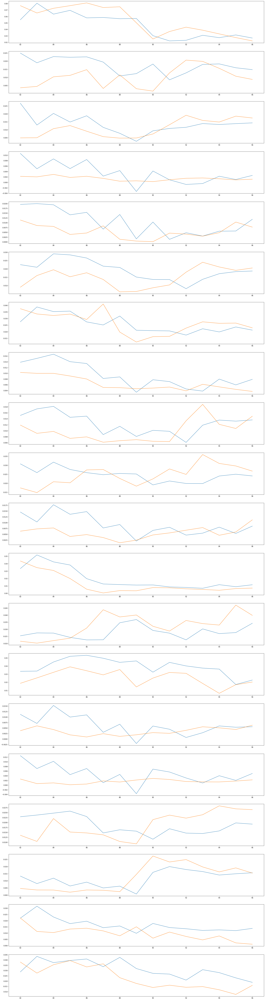

In [33]:
fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+n_windows))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, prediction[i], label="prediction")
  axs[i].plot(x, actual[i], label="actual")

# 4. Other models

**4.0 Prepare Datasets**

In [57]:
# training set up 
features_column = ["open", "close", "high", "low"]
target_column = "close"
steps = 20 #use 20 timesteps for each training sample
train_start = steps
train_window = 72
test_start = train_start + train_window
test_window = 32

# prepare datasets
X_train, X_train_lstm, y_train, scaler = prepare_train_data(df, features_column, target_column, steps, train_start, train_window)
X_test, X_test_lstm, y_test = prepare_test_data(df, features_column, target_column, steps, scaler, test_start, test_window)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


(36000, 80) (36000, 20, 4) (36000,)
(16000, 80) (16000, 20, 4) (16000,)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


**4.1 Linear Regression**

In [42]:
from sklearn.linear_model import LinearRegression

lr_regressor = LinearRegression()
model = lr_regressor.fit(X_train, y_train)
print("score of the model:", model.score(X_train, y_train))
print("coefficients:", model.coef_)

score of the model: 0.9208553111002997
coefficients: [-2.36486029e-02  8.27454525e-01 -1.04460799e-01  2.05875285e-02
  1.64639258e-01  1.19870303e-01 -1.54658245e-01  2.37935292e-03
 -7.82044331e-02 -8.63489097e-02 -2.71342567e-02  8.63123698e-02
  1.62115277e-02  7.45718838e-02 -5.89794092e-02  3.54581557e-02
 -1.41116571e-01 -6.51596364e-02  3.56088710e-02  5.11839446e-02
  4.41491686e-03  1.62958635e-01 -1.17493899e-01  4.54592652e-02
  5.41676349e-02  4.55053918e-02 -4.87281529e-03  6.05909932e-03
  5.66878104e-02  4.21913852e-02 -1.81422613e-01 -1.66072295e-03
 -1.06287697e-02  1.23321954e-01 -1.43335127e-01 -5.36191808e-02
  1.08033682e-03  2.12663928e-01 -1.43264298e-01 -1.22741081e-02
 -4.07182741e-02  4.48190266e-02 -2.64913666e-02  7.61488684e-02
 -1.41098049e-02  3.48322416e-02 -4.50062720e-02  2.41376919e-02
 -9.46455340e-02 -2.75164786e-02  6.11531926e-02  3.25014771e-02
  3.49677450e-03  8.80201682e-02 -1.05989396e-01  3.82351804e-02
  4.48253395e-02  4.00574397e-02 -3.7

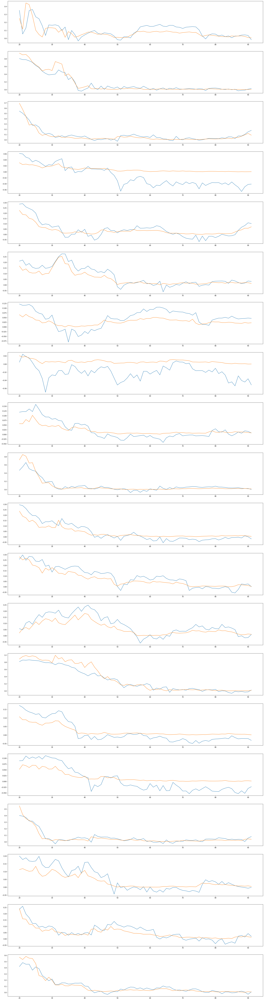

In [44]:
#training results
y_pred = model.predict(X_train)
y_pred = np.reshape(y_pred, (-1, train_window))
y_test = np.reshape(y_train, (-1, train_window))
x = list(range(train_start, train_start+train_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(train_start, train_start+train_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test[i], label="actual")

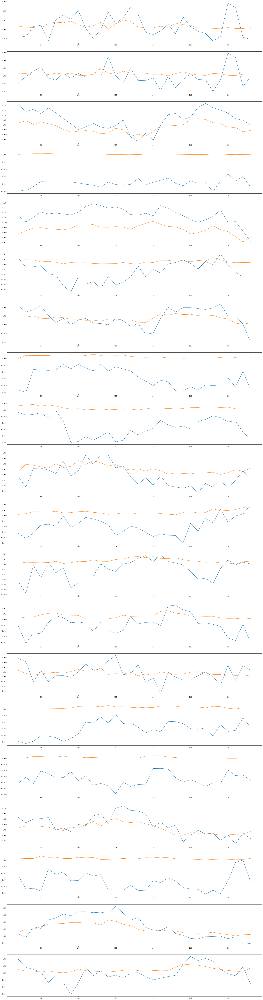

In [43]:
#testing results
y_pred = model.predict(X_test)
y_pred = np.reshape(y_pred, (-1, test_window))
y_test = np.reshape(y_test, (-1, test_window))
x = list(range(test_start, test_start+test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test[i], label="actual")

**4.2 Lasso**

In [48]:
from sklearn.linear_model import Lasso

lasso_regressor = Lasso(alpha=0.001)
model = lasso_regressor.fit(X_train, y_train)
print("score of the model:", model.score(X_train, y_train))
print("coefficients:", model.coef_)

score of the model: 0.8978289184433619
coefficients: [0.         0.26015236 0.         0.40474082 0.         0.
 0.         0.00915039 0.         0.         0.         0.02485558
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.01015682
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.0129241  0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.05436362
 0.         0.         0.         0.00890947 0.         0.
 0.         0.01268023 0.         0.         0.         0.01444098
 0.         0.         0.         0.         0.         0.
 0.         0.05346163]


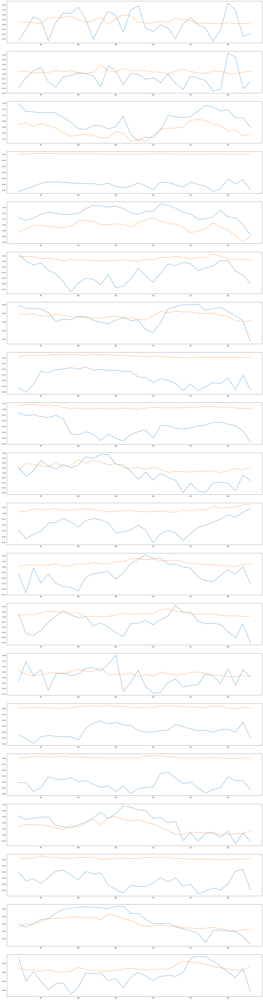

In [51]:
#testing results
y_pred = model.predict(X_test)
y_pred = np.reshape(y_pred, (-1, test_window))
y_test_new = np.reshape(y_test, (-1, test_window))
x = list(range(test_start, test_start+test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test_new[i], label="actual")

**4.3 Ridge**

In [52]:
from sklearn.linear_model import Ridge

ridge_regressor = Ridge(alpha=0.0001)
model = ridge_regressor.fit(X_train, y_train)
print("score of the model:", model.score(X_train, y_train))
print("coefficients:", model.coef_)

score of the model: 0.9208553110975928
coefficients: [-2.36528210e-02  8.27441478e-01 -1.04448554e-01  2.05941870e-02
  1.64631946e-01  1.19863278e-01 -1.54652025e-01  2.38228693e-03
 -7.81997094e-02 -8.63440054e-02 -2.71366291e-02  8.63115928e-02
  1.62090109e-02  7.45661141e-02 -5.89769268e-02  3.54592741e-02
 -1.41108902e-01 -6.51555529e-02  3.56046937e-02  5.11828748e-02
  4.41323750e-03  1.62949437e-01 -1.17489307e-01  4.54607481e-02
  5.41672095e-02  4.55045009e-02 -4.87242243e-03  6.06047324e-03
  5.66851924e-02  4.21877366e-02 -1.81418416e-01 -1.65852473e-03
 -1.06280989e-02  1.23317058e-01 -1.43331027e-01 -5.36162838e-02
  1.07820355e-03  2.12655589e-01 -1.43259670e-01 -1.22716661e-02
 -4.07161224e-02  4.48192215e-02 -2.64929032e-02  7.61489281e-02
 -1.41097052e-02  3.48308263e-02 -4.50066444e-02  2.41378637e-02
 -9.46418251e-02 -2.75145452e-02  6.11499738e-02  3.25011151e-02
  3.49548669e-03  8.80162250e-02 -1.05986916e-01  3.82358094e-02
  4.48246504e-02  4.00571749e-02 -3.7

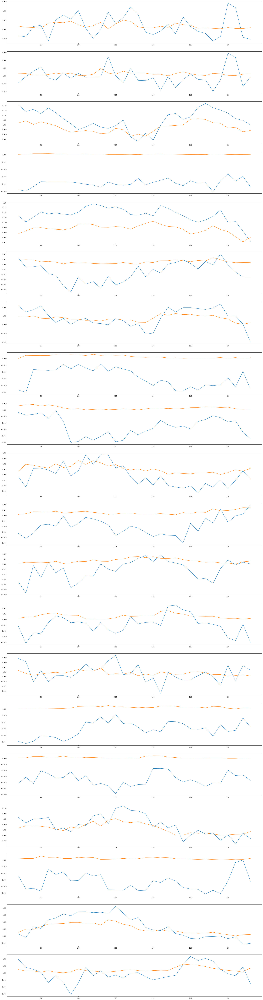

In [53]:
y_pred = model.predict(X_test)
y_pred = model.predict(X_test)
y_pred = np.reshape(y_pred, (-1, test_window))
y_test_new = np.reshape(y_test, (-1, test_window))
x = list(range(test_start, test_start+test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test_new[i], label="actual")

**4.4 Support Vector Machine**

In [54]:
from sklearn.svm import SVR

svr = SVR(C=1.0, kernel='rbf', gamma=0.1)
model = svr.fit(X_train, y_train)
print("score of the model:", model.score(X_train, y_train))

score of the model: 0.858210919455131


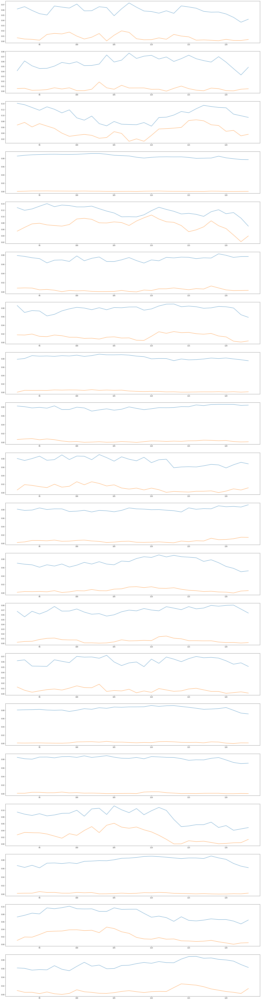

In [58]:
y_pred = model.predict(X_test)
y_pred = model.predict(X_test)
y_pred = np.reshape(y_pred, (-1, test_window))
y_test_new = np.reshape(y_test, (-1, test_window))
x = list(range(test_start, test_start+test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test_new[i], label="actual")

**4.5. Gradient Boost Regressor**

In [59]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(loss='lad', learning_rate=0.1, n_estimators=250, max_depth=8)
model = gbr.fit(X_train, y_train)
print("score of the model:", model.score(X_train, y_train))

score of the model: 0.9799336718516335


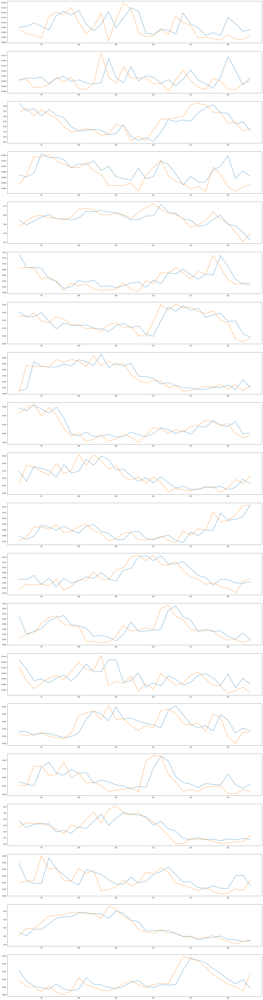

In [60]:
y_pred = model.predict(X_test)
y_pred = np.reshape(y_pred, (-1, test_window))
y_test_new = np.reshape(y_test, (-1, test_window))
x = list(range(test_start, test_start+test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test_new[i], label="actual")

**4.6. AdaBoost**

In [61]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

base_estimator = DecisionTreeRegressor(max_depth=5)
ada = AdaBoostRegressor(base_estimator=base_estimator, n_estimators=100, learning_rate=0.01, loss='linear')
model = ada.fit(X_train, y_train)
print("score of the model:", model.score(X_train, y_train))

score of the model: 0.9769930528518791


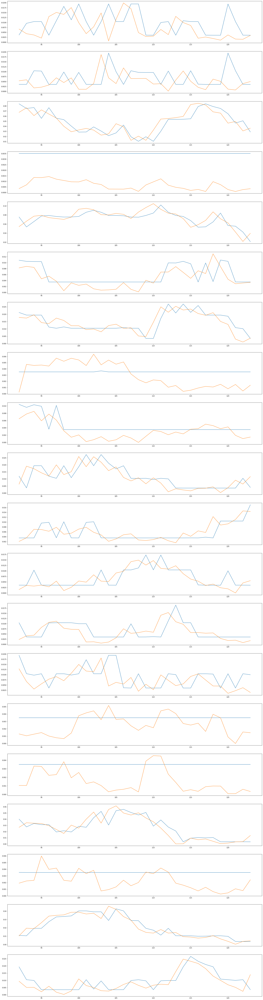

In [62]:
y_pred = model.predict(X_test)
y_pred = np.reshape(y_pred, (-1, test_window))
y_test_new = np.reshape(y_test, (-1, test_window))
x = list(range(test_start, test_start+test_window))

fig, axs = plt.subplots(20, figsize=(30,120))
x = list(range(test_start, test_start+test_window))
for i in range(20): #plot for the first 20 stocks
  axs[i].plot(x, y_pred[i], label="prediction")
  axs[i].plot(x, y_test_new[i], label="actual")